Extracting frames from /home/zhiyin/tml-fencing/clip_9.mp4 to /home/zhiyin/tml-fencing/temp/clip_9...
Initializing and propagating masks...


propagate in video: 100%|██████████| 151/151 [02:34<00:00,  1.02s/it]


Saved video segments and mapping to /home/zhiyin/tml-fencing/temp/clip_9
Tracking fencers across frames...


100%|██████████| 151/151 [00:11<00:00, 13.40it/s]

Detected weird frames: []


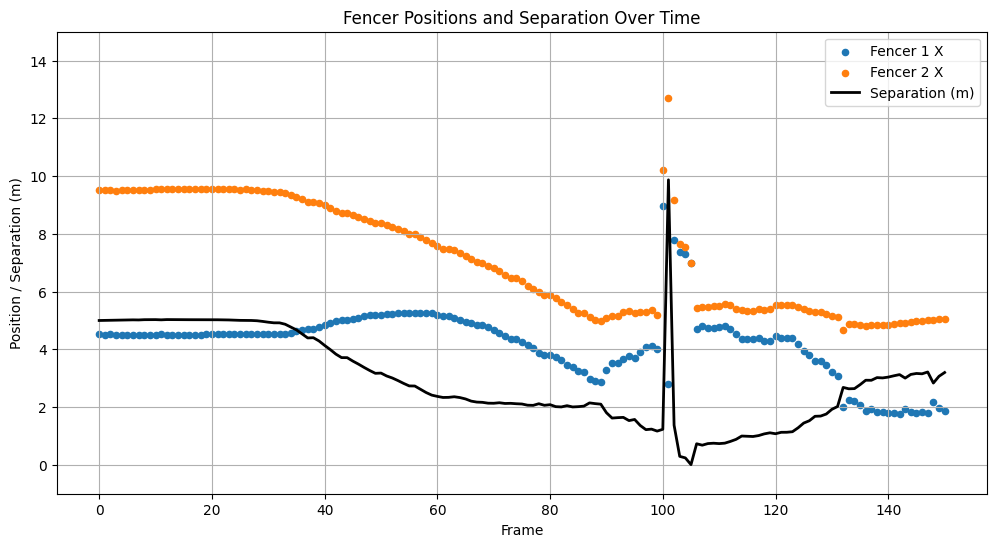

In [7]:
from json import load
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

import os
import cv2
import numpy as np
import torch
import pickle
import pandas as pd
import matplotlib.pyplot as plt

from sam2.build_sam import build_sam2_video_predictor
from tqdm import tqdm

from ultralytics import YOLO


class Sam2FencerTracker:
    def __init__(self,
                 sam2_checkpoint: str,
                 sam2_config: str,
                 piste_width_m: float = 2.0,
                 line_distances: dict = None,
                 short_line_tol: float = 0.01,  # minimum length of line to keep
                 slope_border_max: float = 0.3,
                 min_sep_px: float = 150,
                 device: str = None,
                 verbose: bool = False):
        
        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")
        self.piste_width = piste_width_m
        self.verbose = verbose
        self.line_distances = line_distances or {
            "en_garde_left": 5.0,
            "middle": 7.0,
            "en_garde_right": 9.0
        }
        self._map_name_to_obj_id_dict = {}
        self.model = build_sam2_video_predictor(sam2_config, sam2_checkpoint, device=self.device)

        self.short_line_tol = short_line_tol # minimum length of line to keep
        self.slope_border_max = slope_border_max
        self.min_sep_px = min_sep_px
        self.yolo_model = YOLO("yolov8n.pt").to(self.device)

        self.video_frames = None

    def extract_frames(self, video_path: str, output_dir: str) -> list:
        os.makedirs(output_dir, exist_ok=True)
        cap = cv2.VideoCapture(video_path)
        frame_names = []
        idx = 0
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame_name = f"{idx}.jpg"
            cv2.imwrite(os.path.join(output_dir, frame_name), frame)
            frame_names.append(frame_name)
            idx += 1
        cap.release()
        return frame_names
    
    def initialize_masks(self, video_dir: str, prompt_points: dict, frame_to_use: int = 0) -> dict:
        if "video_segments.pkl" in os.listdir(video_dir) and "name_to_obj_id.pkl" in os.listdir(video_dir):
            print("Loading existing video segments...")
            video_segments = pickle.load(open(os.path.join(video_dir, "video_segments.pkl"), "rb"))
            self._map_name_to_obj_id_dict.update(pickle.load(open(os.path.join(video_dir, "name_to_obj_id.pkl"), "rb")))
            return video_segments
        
        prompt_points = self._preprocess_prompt_points(prompt_points, frame_to_use)

        inference_state = self.model.init_state(video_path=video_dir)
        masks = {}
        for obj_id, name in enumerate(prompt_points):
            points = prompt_points[name]
            labels = np.array([1] * len(points))
            _, out_obj_ids, out_mask_logits = self.model.add_new_points_or_box(
                inference_state, frame_idx=frame_to_use, obj_id=obj_id,
                points=points, labels=labels
            )
            masks[obj_id] = (out_mask_logits[-1] > 0)[0].cpu().numpy()
            self._map_name_to_obj_id_dict[name] = obj_id

        if self.verbose:
            self.visualize_masks(masks, self.video_frames[frame_to_use])

        video_segments = {}
        for out_frame_idx, out_obj_ids, out_mask_logits in self.model.propagate_in_video(inference_state):
            video_segments[out_frame_idx] = {
                out_obj_id: (out_mask_logits[i] > 0).cpu().numpy()
                for i, out_obj_id in enumerate(out_obj_ids)
            }
        
        # Save video segments and mapping
        with open(os.path.join(video_dir, "video_segments.pkl"), "wb") as f:
            pickle.dump(video_segments, f)
        with open(os.path.join(video_dir, "name_to_obj_id.pkl"), "wb") as f:
            pickle.dump(self._map_name_to_obj_id_dict, f)
        print(f"Saved video segments and mapping to {video_dir}")
        return video_segments

    def track_image(self, video_dir: str, f_idx: int = 0) -> tuple:
        if self.video_frames is None:
            self.video_frames = [cv2.imread(os.path.join(video_dir, f)) for f in os.listdir(video_dir) if f.endswith('.jpg')]
        
        # Load video segments
        video_segments = pickle.load(open(os.path.join(video_dir, "video_segments.pkl"), "rb"))
        self._map_name_to_obj_id_dict.update(pickle.load(open(os.path.join(video_dir, "name_to_obj_id.pkl"), "rb")))
        P_fencer_pix, world_xy = self.detect_and_project_fencers(video_segments, f_idx)
        return P_fencer_pix, world_xy
    
    def detect_and_project_fencers(self, video_segments, f_idx):
        frame = self.video_frames[f_idx]            

        # (1) detect piste borders with LSD
        piste_id = self._map_name_to_obj_id("piste")
        full_mask = video_segments[f_idx][piste_id][0].astype(np.uint8) * 255
        (H, W) = full_mask.shape
        piste_rgb = cv2.bitwise_and(frame, frame, mask=full_mask)
        piste_rgb = cv2.cvtColor(piste_rgb, cv2.COLOR_BGR2RGB)
        border_lines = self._find_border_lines(piste_rgb)
        
        # 2) extend each tracked piste lines to borders
        assignment = {}
        for obj_id, raw_mask in video_segments[f_idx].items():
            name = self._map_obj_id_to_name(obj_id)
            if name not in self.line_distances:
                continue
            mask = raw_mask.squeeze().astype(np.uint8)
            ext = self._extend_mask_line(mask, border_lines)
            if ext is None:
                continue
            x1,y1,x2,y2 = ext
            assignment[(x1,y1,x2,y2)] = name

        # 3) build homography control points
        PIX, WORLD = [], []
        for (x1,y1,x2,y2), name in assignment.items():
            PIX += [[x1,y1],[x2,y2]]
            d = self.line_distances[name]
            if y1 > y2:
                WORLD += [[d,0],[d,self.piste_width]]
            else:
                WORLD += [[d,self.piste_width],[d,0]]
        
        P = np.float32(PIX);  Wp = np.float32(WORLD)
        H_pw, _ = cv2.findHomography(P, Wp)

        # 4) detect fencers & extract their projection points in pixel coords
        P_fencer_pix = []
        for obj_id, raw_mask in video_segments[f_idx].items():
            name = self._map_obj_id_to_name(obj_id)
            if "fencer" not in name:
                continue
            # pull the mask, remove any channel dimension
            mask = np.squeeze(raw_mask).astype(bool)               # now (H, W)

            ys, xs = np.nonzero(mask)
            if len(xs) == 0:
                continue

            # median x as lateral position
            px = np.median(xs)

            # vertical ray at px
            vert = (px, 0.0, px, float(H-1))

            # intersect with both borders
            intersects = [self._intersect_lines(vert, bl) for bl in border_lines]
            intersects = [p for p in intersects if p is not None]

            if len(intersects) == 2:
                # take the midpoint of the two intersections
                (x1, y1), (x2, y2) = intersects
                px_strip = (x1 + x2) / 2.0
                py_strip = (y1 + y2) / 2.0
            else:
                # fallback: if something went wrong, use the single intersection or bottom of image
                if intersects:
                    px_strip, py_strip = intersects[0]
                else:
                    px_strip, py_strip = px, float(H-1)

            P_fencer_pix.append(np.array([px_strip, py_strip], dtype=np.float32))

        
        # 5) warp to world coordinates
        if P_fencer_pix:
            homo    = np.hstack([P_fencer_pix, np.ones((len(P_fencer_pix),1),np.float32)])
            world_h = (H_pw @ homo.T).T
            world_xy= world_h[:,:2]/world_h[:,2:3]
        else:
            world_xy = np.zeros((0,2),dtype=np.float32)

        # ————————— VISUALIZATION OVERLAY —————————————
        if self.verbose:
            vis = frame.copy()

            # a) Overlay the three masks with distinct semi-transparent colors
            #    (you can tweak colors and alpha as you like)
            mask_colors = {
                1: (255, 255,   0),  # yellow for en_garde_left
                2: (255,   0, 255),  # magenta for middle
                3: (  0, 255, 255),  # cyan for en_garde_right
            }
            alpha = 0.3
            overlay = vis.copy()
            for obj_id, raw in video_segments[f_idx].items():
                mask = raw.squeeze().astype(bool)  # H×W boolean mask
                color = mask_colors.get(obj_id, (255,255,255))
                overlay[mask] = color
            # blend overlay onto vis
            vis = cv2.addWeighted(overlay, alpha, vis, 1 - alpha, 0)

            # b) Draw the two border lines (green)
            for x1, y1, x2, y2 in border_lines:
                cv2.line(vis, (int(x1), int(y1)), (int(x2), int(y2)), (0,255,0), 3)

            # c) Draw your extended mask-lines (red)
            for (x1, y1, x2, y2), _ in assignment.items():
                cv2.line(vis, (int(x1), int(y1)), (int(x2), int(y2)), (0,0,255), 2)

            # d) Plot the fencer pelvis projection points (blue)
            for x, y in P_fencer_pix:
                cv2.circle(vis, (int(x), int(y)), 8, (255,0,0), -1)

            # finally display
            plt.figure(figsize=(10,6))
            plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
            plt.axis("off")
            plt.title(f"Frame {f_idx}: + bounding boxes & skeleton")
            plt.show()
        # ————————— END VISUALIZATION ———————————————
        return P_fencer_pix, world_xy

    def track_video(self, 
                    video_path: str, 
                    video_dir: str, 
                    prompt_points: list,
                    output_csv: str = "world_coords.csv") -> pd.DataFrame:
        
        print(f"Extracting frames from {video_path} to {video_dir}...")
        frame_names = self.extract_frames(video_path, video_dir)
        self.video_frames = [cv2.imread(os.path.join(video_dir, f)) for f in frame_names]

        print("Initializing and propagating masks...")
        video_segments = self.initialize_masks(video_dir, prompt_points)

        print("Tracking fencers across frames...")
        results_pix, results_world = [], []

        for f_idx in tqdm(range(len(self.video_frames))):
            P_fencer_pix, world_xy = self.detect_and_project_fencers(video_segments, f_idx)
            results_pix.append(P_fencer_pix)
            results_world.append(world_xy)

        # Save results
        df = self._save_results(results_world, output_csv)
        return df
    
    def visualize_masks(self, masks, frame, alpha=0.5):
        vis = frame.copy().astype(np.float32) / 255.0  # normalize to [0,1]
        cmap = plt.get_cmap('tab20')

        for obj_id, mask in masks.items():
            color = np.array(cmap(obj_id % 20)[:3])  # RGB only, already in [0,1] range
            mask = mask.squeeze()

            for c in range(3):
                vis[..., c] = np.where(mask, 
                                    vis[..., c] * (1 - alpha) + color[c] * alpha, 
                                    vis[..., c])

        vis = np.clip(vis, 0, 1)
        vis = (vis * 255).astype(np.uint8)  # back to uint8

        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title("Masks Visualization with Transparency")
        plt.show()

    def _intersect_lines(self, l1, l2):
        x1,y1,x2,y2 = l1
        x3,y3,x4,y4 = l2
        denom = (x1-x2)*(y3-y4) - (y1-y2)*(x3-x4)
        if abs(denom) < 1e-6:
            return None
        xi = ((x1*y2-y1*x2)*(x3-x4) - (x1-x2)*(x3*y4-y3*x4)) / denom
        yi = ((x1*y2-y1*x2)*(y3-y4) - (y1-y2)*(x3*y4-y3*x4)) / denom
        return (xi, yi)
    
    def _map_name_to_obj_id(self, target):
        if target in self._map_name_to_obj_id_dict:
            return self._map_name_to_obj_id_dict[target]
        else:
            raise ValueError(f"Target '{target}' not found in mapping dictionary {self._map_name_to_obj_id_dict}.")
    
    def _map_obj_id_to_name(self, target):
        for name, obj_id in self._map_name_to_obj_id_dict.items():
            if obj_id == target:
                return name
        return None

    def _extend_mask_line(self, mask, border_lines):
        """
        mask: 2D uint8 mask (H,W), nonzero = segment pixels
        border_lines: list of two (x1,y1,x2,y2) tuples
        Returns: (xi1, yi1, xi2, yi2) or None
        """
        ys, xs = np.nonzero(mask>0)
        if xs.size < 2:
            return None

        # stack into N×2 array
        pts = np.stack([xs, ys], axis=1).astype(np.float64)
        # centroid
        Cx, Cy = pts.mean(axis=0)

        # PCA: cov matrix of (x,y)
        cov = np.cov(pts, rowvar=False)
        w, v = np.linalg.eigh(cov)
        # principal direction = eigenvector with largest eigenvalue
        direction = v[:, np.argmax(w)]
        direction = direction / (np.linalg.norm(direction) + 1e-9)
        dx, dy = direction

        # two “far” points on that infinite line
        far = 10000.0
        P1 = (Cx - dx*far, Cy - dy*far)
        P2 = (Cx + dx*far, Cy + dy*far)
        L  = (P1[0], P1[1], P2[0], P2[1])

        # intersect with each border_line
        def intersect(l1, l2):
            x1,y1,x2,y2 = l1
            x3,y3,x4,y4 = l2
            denom = (x1-x2)*(y3-y4) - (y1-y2)*(x3-x4)
            if abs(denom) < 1e-6:
                return None
            xi = ((x1*y2 - y1*x2)*(x3-x4) - (x1-x2)*(x3*y4 - y3*x4)) / denom
            yi = ((x1*y2 - y1*x2)*(y3-y4) - (y1-y2)*(x3*y4 - y3*x4)) / denom
            return (xi, yi)

        pts_int = [intersect(L, bl) for bl in border_lines]
        if None in pts_int:
            return None

        (xi1, yi1), (xi2, yi2) = pts_int
        return (xi1, yi1, xi2, yi2)

    def _extend_segment_to_frame(self, seg, w, h, eps=1e-6):
        x1,y1,x2,y2 = map(float, seg)
        dx, dy = x2-x1, y2-y1
        if abs(dx)<eps: # vertical line  (x = const)
            return np.array([x1,0,x1,h-1])
        if abs(dy)<eps: # horizontal line (y = const)
            return np.array([0,y1,w-1,y1])
        m, b = dy/dx, y1 - (dy/dx)*x1 # general case:   y = m x + b
        pts = []
        for X, Y in [(0,b),(w-1,m*(w-1)+b),(-b/m,0),((h-1-b)/m,h-1)]:
            if 0 <= X <= w-1 and 0 <= Y <= h-1:
                pts.append((X,Y))
        pts = np.array(pts)
        proj = pts.dot(np.array([dx,dy]))
        p1, p2 = pts[proj.argmin()], pts[proj.argmax()]
        return np.hstack([p1, p2])
    
    def _extend_border_edges(self, border_edges, img_shape):
        h, w = img_shape[:2]
        return [self._extend_segment_to_frame(seg, w, h) for seg in border_edges]

    def _pick_two_distinct(self, horiz_lines, min_sep_px=25):
        chosen, centres = [], []
        for x1,y1,x2,y2 in horiz_lines:
            ymid = 0.5*(y1+y2) # mid‑height of the segment
            # Is it far enough from everything we already kept?
            if all(abs(ymid-c)>min_sep_px for c in centres):
                chosen.append((x1,y1,x2,y2)); centres.append(ymid)
                if len(chosen) == 2:
                    break
        return chosen
    
    def _find_lines_LSD(self, piste_bgr):
        gray = cv2.cvtColor(piste_bgr, cv2.COLOR_BGR2GRAY)
        lsd  = cv2.createLineSegmentDetector()
        segs = lsd.detect(gray)[0]
        lines = segs.squeeze()
        lengths = np.hypot(lines[:,2]-lines[:,0], lines[:,3]-lines[:,1])
        return lines[lengths > self.short_line_tol * piste_bgr.shape[1]]  # e.g. >1% of frame width
    
    def _find_border_lines(self, piste_bgr):
        lines = self._find_lines_LSD(piste_bgr)
        # keep near-horizontal lines as borders
        border_candidates = []
        for x1,y1,x2,y2 in lines:
            slope = abs((y2-y1)/(x2-x1+1e-6))
            if slope < self.slope_border_max:
                border_candidates.append((x1,y1,x2,y2))
        # extend and pick two distinct from longest to shortest
        border_lines = sorted(border_candidates, 
                              key=lambda tup: np.hypot(tup[2] - tup[0], tup[3] - tup[1]), 
                              reverse=True)
        ext = self._extend_border_edges(border_lines, piste_bgr.shape)
        picked = self._pick_two_distinct(ext)
        return np.array(picked)
    
    def _preprocess_prompt_points(self, prompt_points, frame_to_use: int) -> dict:
        if "piste" in prompt_points:
            return prompt_points
        frame = self.video_frames[frame_to_use]
        results = self.yolo_model.predict(frame, device=self.device, verbose=False)[0]
        boxes = results.boxes.xyxy.cpu().numpy()
        # TODO: two largest by area excluding referee
        areas = (boxes[:,2]-boxes[:,0]) * (boxes[:,3]-boxes[:,1])
        indices = np.argsort(areas)[-2:][::-1]  # top 2 largest by area
        box1, box2 = boxes[indices]
        # Take center-bottom of each box as fencer points
        def box_center_bottom(box):
            x1, y1, x2, y2 = box
            return [(x1 + x2)/2, max(y1, y2)]

        left_pt, right_pt = box_center_bottom(box1), box_center_bottom(box2)
        midpoint = np.array([(left_pt[0] + right_pt[0]) / 2, (left_pt[1] + right_pt[1]) / 2])
        piste_prompt = np.stack([midpoint, left_pt, right_pt], axis=0)
        prompt_points["piste"] = piste_prompt
        return prompt_points

    def _save_results(self, results_world, output_csv):
        f1_x, f2_x = [], []
        for pts in results_world:
            if pts.shape[0] == 2:
                xs = pts[:,0]
                order = np.argsort(xs)
                f1_x.append(xs[order[0]])
                f2_x.append(xs[order[1]])
            else:
                f1_x.append(np.nan)
                f2_x.append(np.nan)
        dist = np.array(f2_x) - np.array(f1_x)

        df = pd.DataFrame({
            'frame': np.arange(len(f1_x)),
            'fencer1_x': f1_x,
            'fencer2_x': f2_x,
            'distance': dist,
        })
        df.to_csv(output_csv, index=False)
        self.visualize_distance(df)
        return df

    def visualize_distance(self, df, piste_len=14.0, window=5, thresh=2.0):
        f1_x = df['fencer1_x'].to_numpy()
        f2_x = df['fencer2_x'].to_numpy()
        dist = df['distance'].to_numpy()
        N = len(f1_x)

        # --- Detect out-of-bounds ---
        oob1 = np.where((f1_x < 0) | (f1_x > piste_len))[0]
        oob2 = np.where((f2_x < 0) | (f2_x > piste_len))[0]

        # --- Detect temporal outliers ---
        temp1, temp2 = [], []
        for i in range(N):
            lo = max(0, i-window//2)
            hi = min(N, i+window//2+1)
            w1 = f1_x[lo:hi][~np.isnan(f1_x[lo:hi])]
            w2 = f2_x[lo:hi][~np.isnan(f2_x[lo:hi])]
            if len(w1) > 2:
                m1, s1 = w1.mean(), w1.std()
                if abs(f1_x[i] - m1) > max(thresh * s1, 0.3):
                    temp1.append(i)
            if len(w2) > 2:
                m2, s2 = w2.mean(), w2.std()
                if abs(f2_x[i] - m2) > max(thresh * s2, 0.3):
                    temp2.append(i)

        weird = set(oob1) | set(oob2) | set(temp1) | set(temp2)
        print("Detected weird frames:", sorted(list(weird)))

        # --- Plot ---
        plt.figure(figsize=(12,6))

        # fencer positions
        plt.scatter(range(N), f1_x, label='Fencer 1 X', s=20)
        plt.scatter(range(N), f2_x, label='Fencer 2 X', s=20)

        # distance curve
        plt.plot(range(N), dist, label='Separation (m)', color='k', linewidth=2)

        # highlight weird frames
        for i in sorted(weird):
            plt.axvline(i, color='r', alpha=0.3, linewidth=1)

        plt.xlabel('Frame')
        plt.ylabel('Position / Separation (m)')
        plt.title('Fencer Positions and Separation Over Time')
        plt.ylim(-1, piste_len + 1)
        plt.legend()
        plt.grid(True)
        plt.show()


# ------------------------
# Example usage:
tracker = Sam2FencerTracker(
    sam2_checkpoint="../checkpoints/sam2.1_hiera_large.pt",
    sam2_config="./configs/sam2.1/sam2.1_hiera_l.yaml",
    short_line_tol=0.01,  # optional, default is 0.01
    slope_border_max=0.3,  # optional, default is 0.3
    min_sep_px=150,  # optional, default is 150
    verbose=False,
)

video_path = "/home/zhiyin/tml-fencing/clip_9.mp4"
video_dir  = "/home/zhiyin/tml-fencing/temp/clip_9"  # updated video directory

# prompt_points = {
#     "en_garde_left": np.array([(417,753)]),
#     "middle": np.array([(1002,753)]),
#     "en_garde_right": np.array([(1582,746)]),
#     "fencer_left": np.array([[249, 533]]),  # updated fencer1 prompt
#     "fencer_right": np.array([[1242, 495]])   # updated fencer2 prompt
# }

prompt_points = {
    "en_garde_left": np.array([(430,756)]),
    "middle": np.array([(1012,752)]),
    "en_garde_right": np.array([(1597,749)]),
    "fencer_left": np.array([[270, 494]]),  # updated fencer1 prompt
    "fencer_right": np.array([[1761, 470]])   # updated fencer2 prompt
}

df = tracker.track_video(
    video_path=video_path,
    video_dir=video_dir,
    prompt_points=prompt_points,
    output_csv="fencer_distances.csv",
)


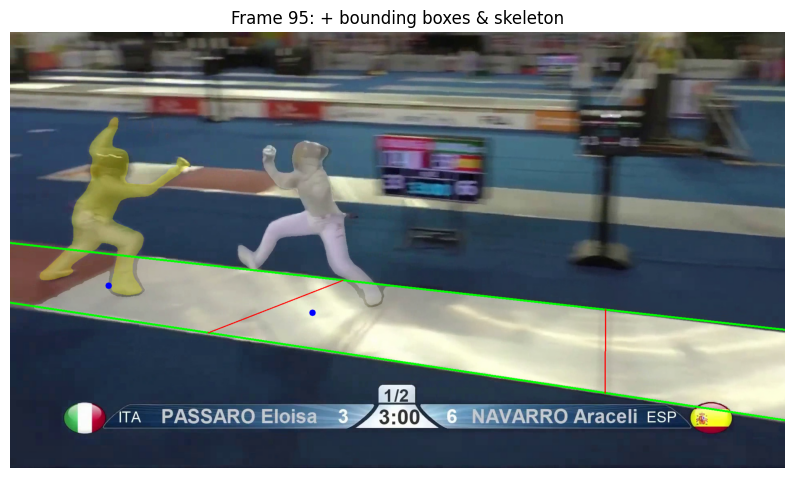

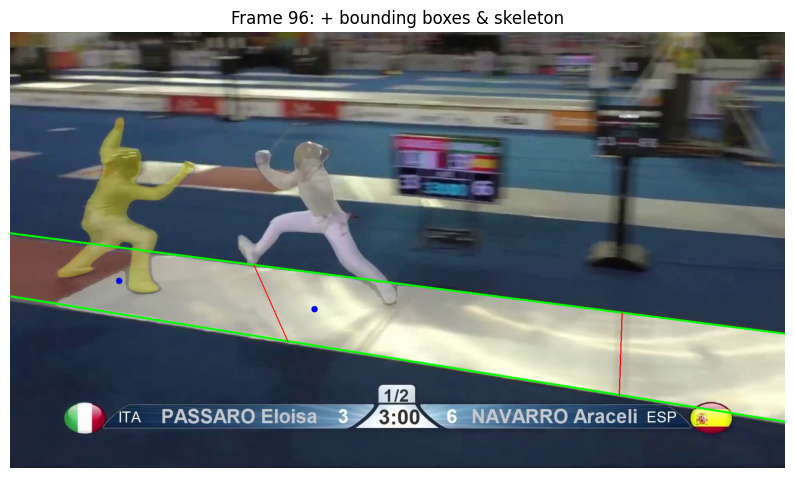

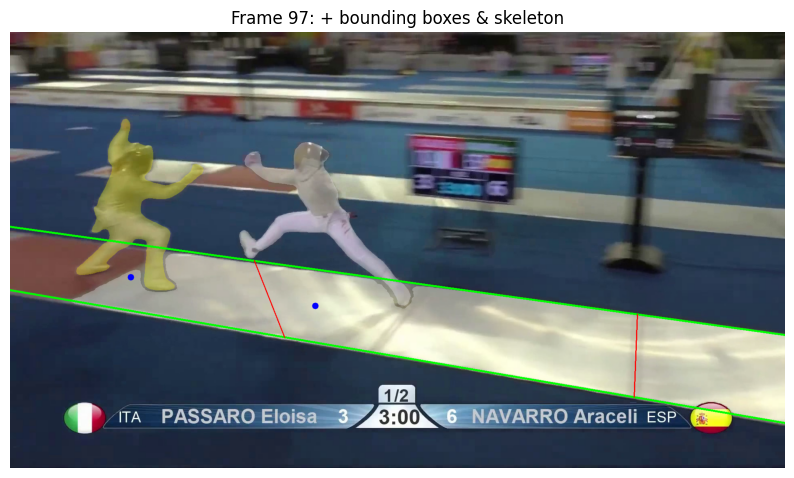

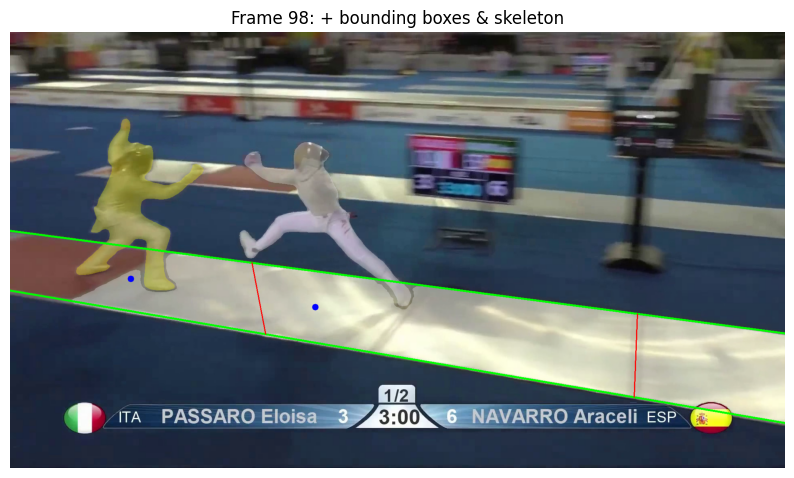

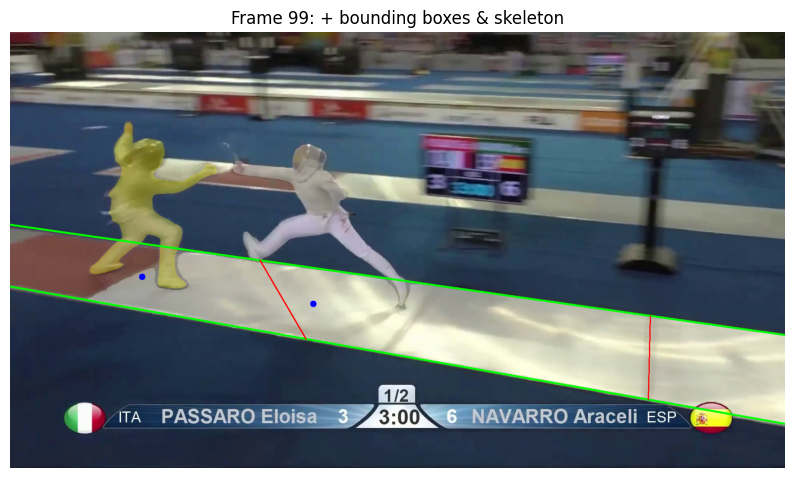

...

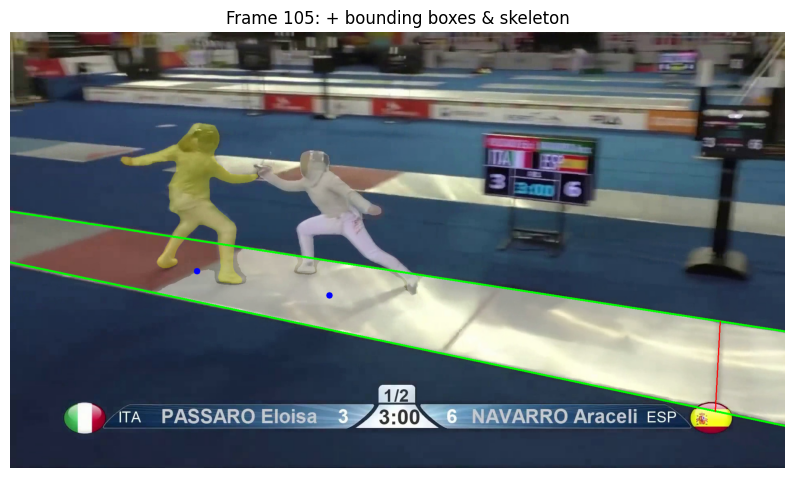

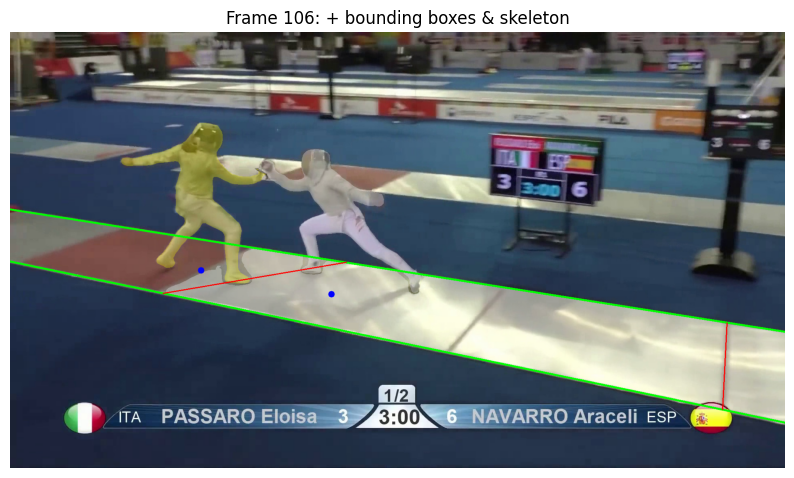

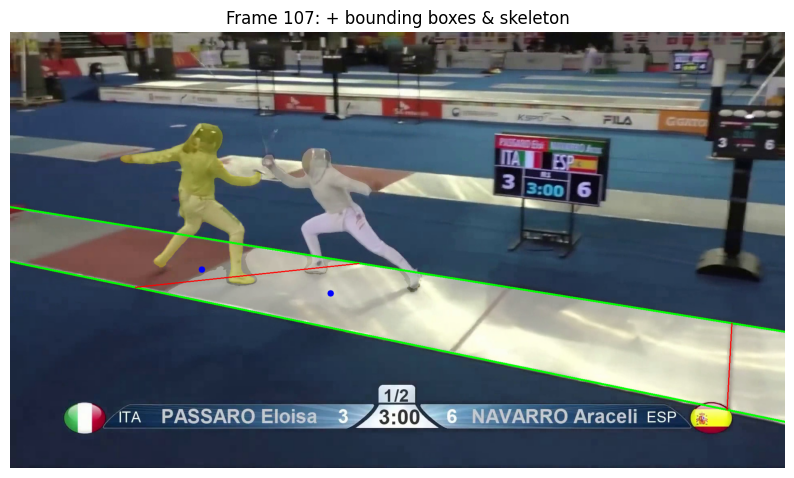

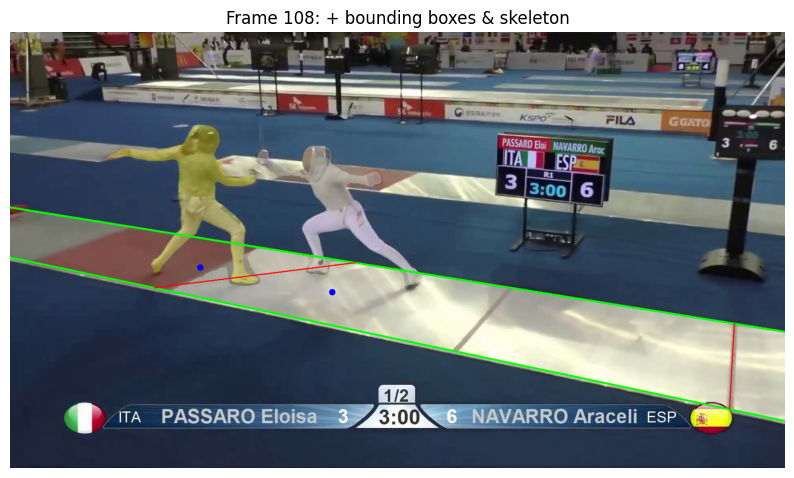

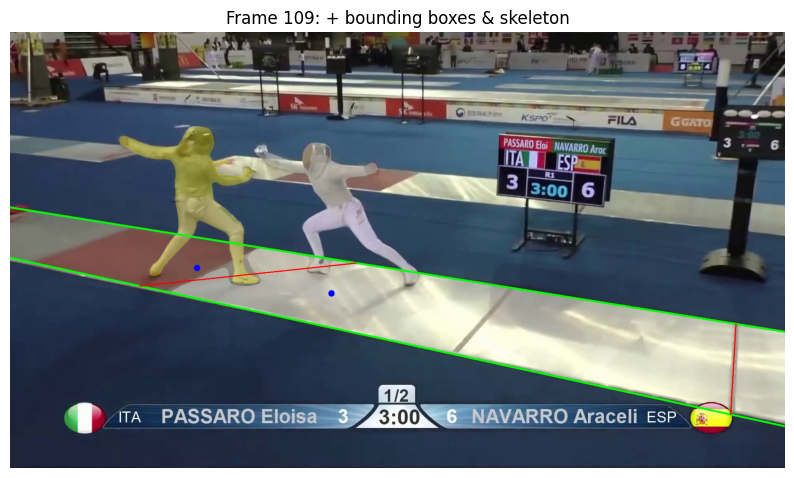

In [10]:
tracker.verbose = True
for f_idx in range(95, 110):
    tracker.track_image(video_dir, f_idx=f_idx)  # updated to use f_idx variable
tracker.verbose = False

In [4]:
# plotly visualize the first frame
video_path = "/home/zhiyin/tml-fencing/clip_9.mp4"
video_dir  = "/home/zhiyin/tml-fencing/temp"  # updated video directory

import cv2

cap = cv2.VideoCapture(video_path)
frame_names = []
idx = 0
ret, frame = cap.read()
cap.release()

if ret:
    import plotly.express as px

    # first_frame_rgb is your H×W×3 uint8 NumPy array
    fig = px.imshow(frame)
    fig.update_traces(
        hovertemplate=(
            '(%{x}, %{y})<br>' +
            'R: %{z[0]}  G: %{z[1]}  B: %{z[2]}<extra></extra>'
        )
    )
    fig.update_layout(coloraxis_showscale=False)
    fig.show()
import numpy as np
prompt_points = {
    "en_garde_left": np.array([(430,756)]),
    "middle": np.array([(1012,752)]),
    "en_garde_right": np.array([(1597,749)]),
    "fencer_left": np.array([[270, 494]]),  # updated fencer1 prompt
    "fencer_right": np.array([[1761, 470]])   # updated fencer2 prompt
}
